In [8]:
import os
os.chdir("/content/drive/MyDrive/Safety Vest Detection")

In [9]:
!pwd

/content/drive/MyDrive/Safety Vest Detection


In [10]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5.git  # clone repo

Cloning into 'yolov5'...
remote: Enumerating objects: 15807, done.
remote: Counting objects: 100% (38/38), done.
remote: Compressing objects: 100% (36/36), done.
remote: Total 15807 (delta 7), reused 22 (delta 2), pack-reused 15769
Receiving objects: 100% (15807/15807), 14.58 MiB | 6.64 MiB/s, done.
Resolving deltas: 100% (10821/10821), done.


In [11]:
%cd yolov5

/content/drive/MyDrive/Safety Vest Detection/yolov5


In [12]:
!pwd

/content/drive/MyDrive/Safety Vest Detection/yolov5


In [13]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 613.0/613.0 kB 50.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.5 MB/s eta 0:00:00


In [14]:
from IPython.display import Image, clear_output  # to display images

In [15]:
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 2.0.1+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


In [16]:
%cd ..

/content/drive/MyDrive/Safety Vest Detection


In [17]:
!unzip train.zip

Archive:  train.zip
   creating: train/images/
  inflating: train/images/pos_1.jpg  
  inflating: train/images/pos_10.jpg  
  inflating: train/images/pos_100.jpg  
  inflating: train/images/pos_1000.jpg  
  inflating: train/images/pos_1001.jpg  
  inflating: train/images/pos_1002.jpg  
  inflating: train/images/pos_1003.jpg  
  inflating: train/images/pos_1004.jpg  
  inflating: train/images/pos_1005.jpg  
  inflating: train/images/pos_1006.jpg  
  inflating: train/images/pos_1007.jpg  
  inflating: train/images/pos_1008.jpg  
  inflating: train/images/pos_1009.jpg  
  inflating: train/images/pos_101.jpg  
  inflating: train/images/pos_1010.jpg  
  inflating: train/images/pos_1011.jpg  
  inflating: train/images/pos_1012.jpg  
  inflating: train/images/pos_1013.jpg  
  inflating: train/images/pos_1014.jpg  
  inflating: train/images/pos_1015.jpg  
  inflating: train/images/pos_1016.jpg  
  inflating: train/images/pos_1017.jpg  
  inflating: train/images/pos_1018.jpg  
  inflating: trai

In [18]:
!unzip test.zip

Archive:  test.zip
   creating: test/images/
  inflating: test/images/pos_1361.jpg  
  inflating: test/images/pos_1362.jpg  
  inflating: test/images/pos_1363.jpg  
  inflating: test/images/pos_1364.jpg  
  inflating: test/images/pos_1365.jpg  
  inflating: test/images/pos_1366.jpg  
  inflating: test/images/pos_1367.jpg  
  inflating: test/images/pos_1368.jpg  
  inflating: test/images/pos_1369.jpg  
  inflating: test/images/pos_1370.jpg  
  inflating: test/images/pos_1371.jpg  
  inflating: test/images/pos_1372.jpg  
  inflating: test/images/pos_1373.jpg  
  inflating: test/images/pos_1374.jpg  
  inflating: test/images/pos_1375.jpg  
  inflating: test/images/pos_1376.jpg  
  inflating: test/images/pos_1377.jpg  
  inflating: test/images/pos_1378.jpg  
  inflating: test/images/pos_1379.jpg  
  inflating: test/images/pos_1380.jpg  
  inflating: test/images/pos_1381.jpg  
  inflating: test/images/pos_1382.jpg  
  inflating: test/images/pos_1383.jpg  
  inflating: test/images/pos_1384.j

In [19]:
%cat data.yaml

train: ../train/images
val: ../test/images

nc: 2
names: ['Hard-Hat', 'Safety Vest']

In [20]:
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [21]:
num_classes

'2'

In [22]:
#this is the model configuration we will use
%cat yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]

In [23]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [24]:
%%writetemplate yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [25]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights 'yolov5s.pt' --name yolov5s_results  --cache

/content/drive/MyDrive/Safety Vest Detection/yolov5
train: weights=yolov5s.pt, cfg=./models/custom_yolov5s.yaml, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
fatal: cannot change to '/content/drive/MyDrive/Safety': No such file or directory
YOLOv5 🚀 2023-7-5 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, 

In [26]:
!pwd

/content/drive/MyDrive/Safety Vest Detection/yolov5


In [27]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [28]:
!pwd

/content/drive/MyDrive/Safety Vest Detection/yolov5


In [29]:
!nvidia-smi

Wed Jul  5 07:41:15 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   57C    P8    11W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

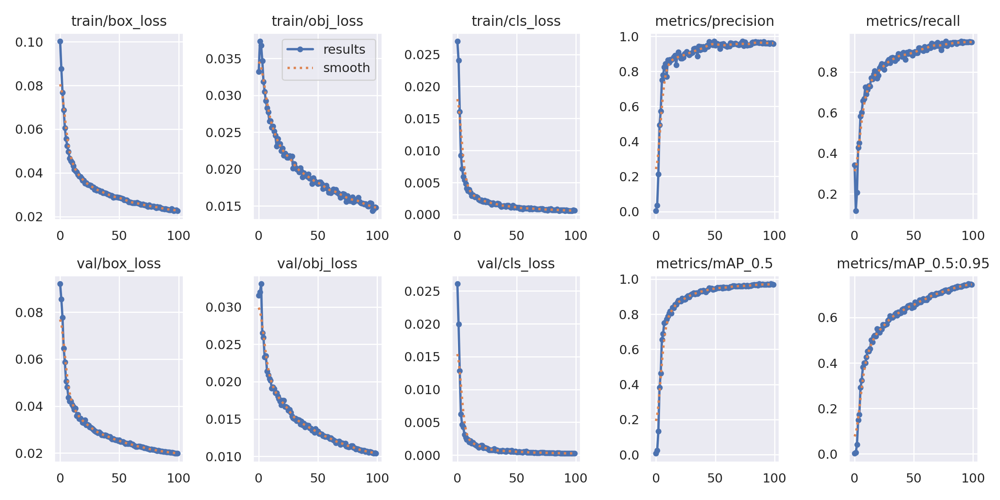

In [30]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='runs/train/yolov5s_results/results.png', width=1000)  # view results.png

GROUND TRUTH TRAINING DATA:


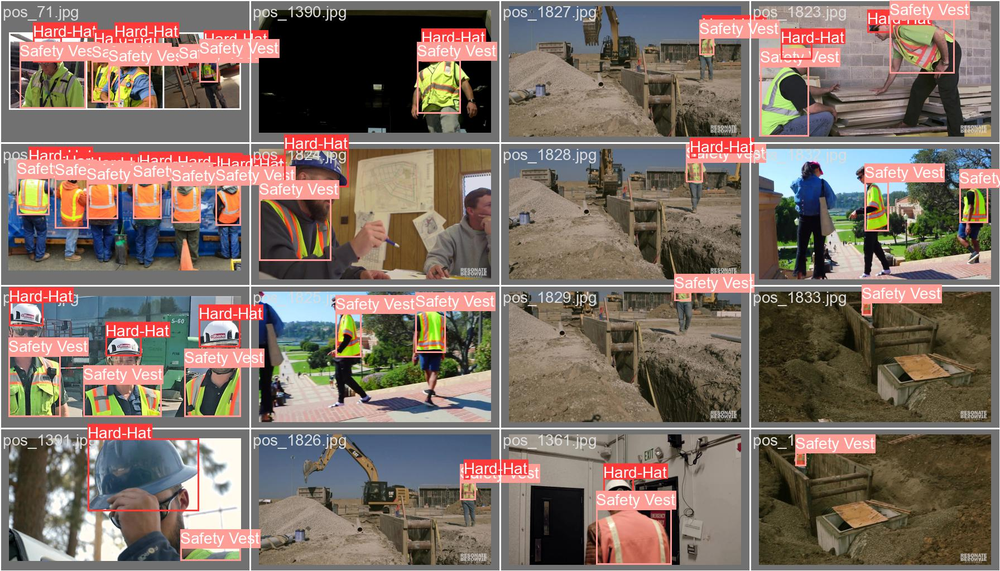

In [31]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='runs/train/yolov5s_results/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


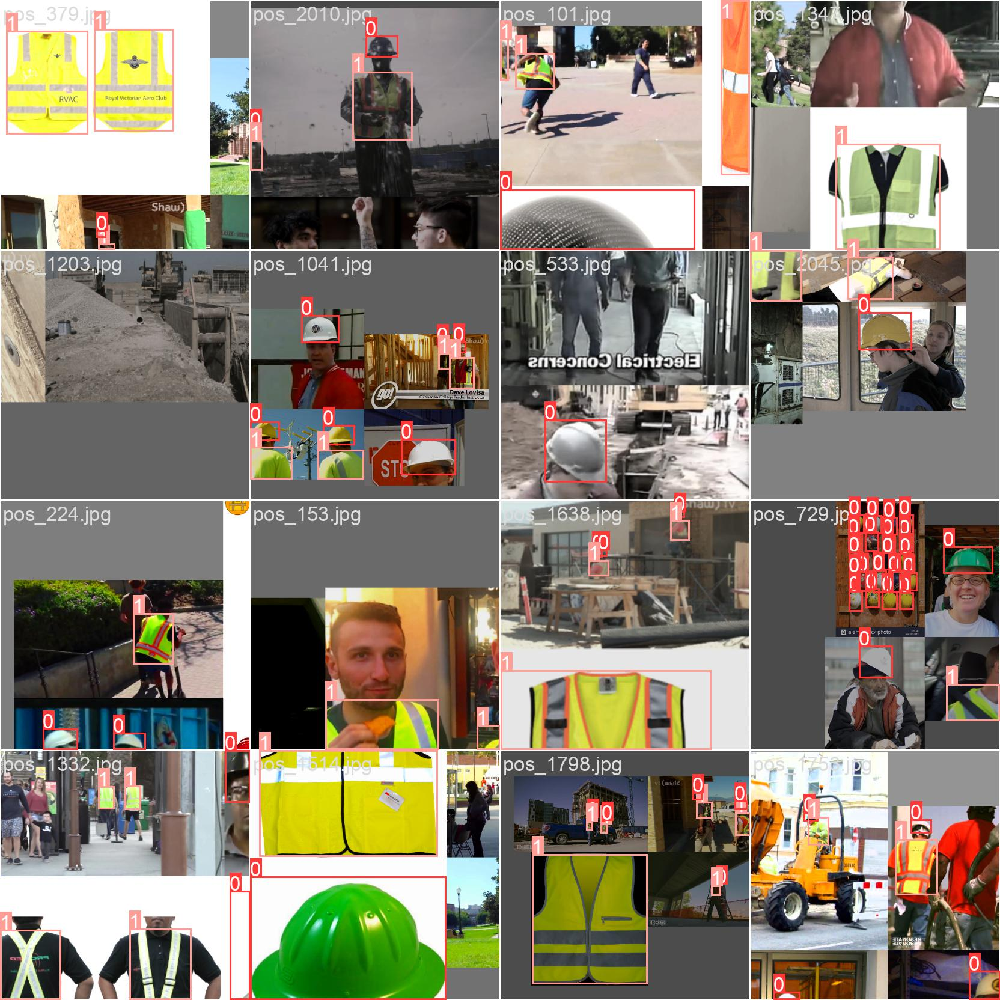

In [32]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='runs/train/yolov5s_results/train_batch0.jpg', width=900)

### Run Inference With Trained Weights

In [33]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [34]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [35]:
!pwd

/content/drive/MyDrive/Safety Vest Detection/yolov5


In [36]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source ../test/images

detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
fatal: cannot change to '/content/drive/MyDrive/Safety': No such file or directory
YOLOv5 🚀 2023-7-5 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7249215 parameters, 0 gradients
image 1/201 /content/drive/MyDrive/Safety Vest Detection/test/images/pos_1361.jpg: 256x416 1 Hard-Hat, 1 Safety Vest, 115.5ms
image 2/201 /content/drive/MyDrive/Safety Vest Detection/test/images/pos_1362.jpg: 256x416 1 Hard-Hat, 1 Safety Vest, 13.5ms
image 3/201 /conten

In [37]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('yolov5/runs/detect/exp*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [38]:
!pwd

/content/drive/MyDrive/Safety Vest Detection/yolov5


In [39]:
%cp runs/train/yolov5s_results/weights/best.pt "/content/drive/MyDrive/Safety Vest Detection/model"

In [40]:
!pip install torch
import torch

In [41]:
!pwd

/content/drive/MyDrive/Safety Vest Detection/yolov5


In [42]:
import torch

In [43]:
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/Safety Vest Detection/model/best.pt', force_reload=True)

/usr/local/lib/python3.10/dist-packages/torch/hub.py:286: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2023-7-5 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7249215 parameters, 0 gradients
Adding AutoShape... 


In [44]:
import os

In [45]:
img = os.path.join('data', 'images', '/content/drive/MyDrive/Safety Vest Detection/test/images/pos_59.jpg')

In [46]:
results = model(img)
results.print()

image 1/1: 300x620 7 Hard-Hats, 6 Safety Vests
Speed: 15.2ms pre-process, 2964.1ms inference, 2.0ms NMS per image at shape (1, 3, 320, 640)


In [47]:
import matplotlib.pyplot as plt
import numpy as np

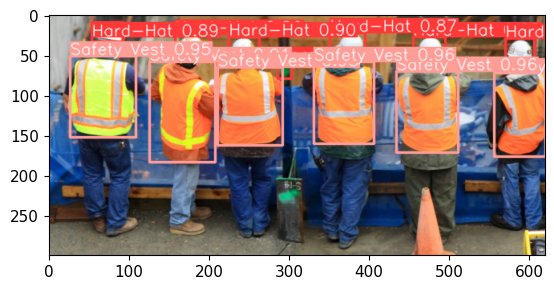

In [48]:
%matplotlib inline
plt.imshow(np.squeeze(results.render()))
plt.show()

In [51]:
import os
img1 = os.path.join('data', 'images', '/content/drive/MyDrive/Safety Vest Detection/test/images/pos_54.jpg')

In [52]:
results1 = model(img1)
results1.print()

image 1/1: 400x770 3 Hard-Hats, 3 Safety Vests
Speed: 25.7ms pre-process, 42.9ms inference, 1.6ms NMS per image at shape (1, 3, 352, 640)


In [53]:
import matplotlib.pyplot as plt
import numpy as np

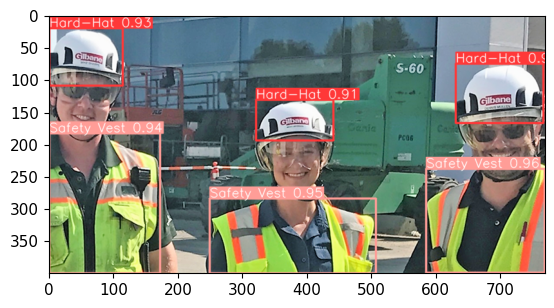

In [54]:
%matplotlib inline
plt.imshow(np.squeeze(results1.render()))
plt.show()

In [69]:
import os
img2 = os.path.join('data', 'images', '/content/drive/MyDrive/Safety Vest Detection/testing/image1.jpg')

In [70]:
results2 = model(img2)
results2.print()

image 1/1: 400x300 1 Hard-Hat
Speed: 9.1ms pre-process, 9.4ms inference, 1.4ms NMS per image at shape (1, 3, 640, 480)


In [71]:
import matplotlib.pyplot as plt
import numpy as np

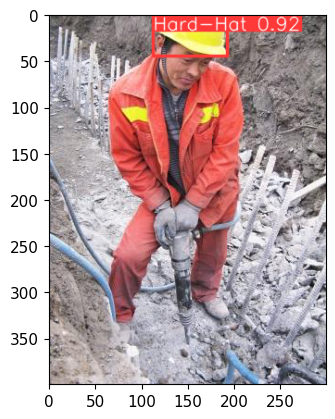

In [72]:
%matplotlib inline
plt.imshow(np.squeeze(results2.render()))
plt.show()

In [77]:
import os
img3 = os.path.join('data', 'images', '/content/drive/MyDrive/Safety Vest Detection/testing/image2.jpg')

In [78]:
results3 = model(img3)
results3.print()

image 1/1: 300x450 (no detections)
Speed: 8.6ms pre-process, 9.8ms inference, 0.9ms NMS per image at shape (1, 3, 448, 640)


In [79]:
import matplotlib.pyplot as plt
import numpy as np

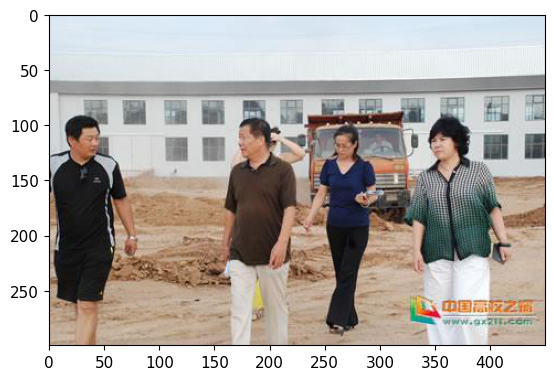

In [80]:
%matplotlib inline
plt.imshow(np.squeeze(results3.render()))
plt.show()

In [85]:
import os
img4 = os.path.join('data', 'images', '/content/drive/MyDrive/Safety Vest Detection/testing/image3.jpg')

In [86]:
results4 = model(img4)
results4.print()

image 1/1: 600x400 3 Hard-Hats, 2 Safety Vests
Speed: 578.5ms pre-process, 68.9ms inference, 1.6ms NMS per image at shape (1, 3, 640, 448)


In [87]:
import matplotlib.pyplot as plt
import numpy as np

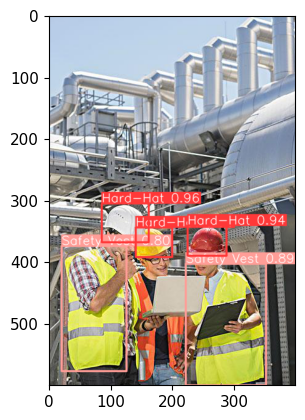

In [88]:
%matplotlib inline
plt.imshow(np.squeeze(results4.render()))
plt.show()

In [89]:
import os
img5 = os.path.join('data', 'images', '/content/drive/MyDrive/Safety Vest Detection/testing/image4.jpg')

In [90]:
results5 = model(img5)
results5.print()

image 1/1: 369x500 (no detections)
Speed: 584.3ms pre-process, 42.4ms inference, 0.5ms NMS per image at shape (1, 3, 480, 640)


In [91]:
import matplotlib.pyplot as plt
import numpy as np

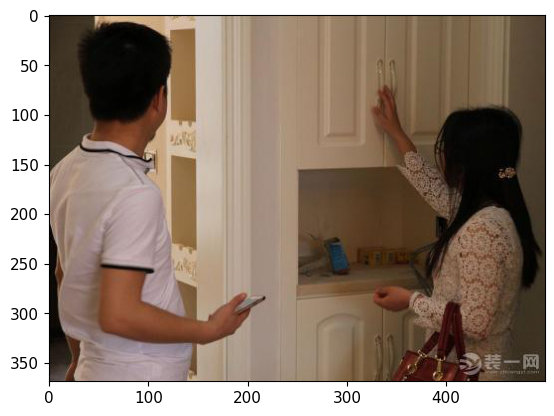

In [92]:
%matplotlib inline
plt.imshow(np.squeeze(results5.render()))
plt.show()

In [93]:
import os
img6 = os.path.join('data', 'images', '/content/drive/MyDrive/Safety Vest Detection/testing/image5.jpg')

In [94]:
results6 = model(img6)
results6.print()

image 1/1: 334x500 14 Hard-Hats
Speed: 644.2ms pre-process, 9.8ms inference, 1.5ms NMS per image at shape (1, 3, 448, 640)


In [95]:
import matplotlib.pyplot as plt
import numpy as np

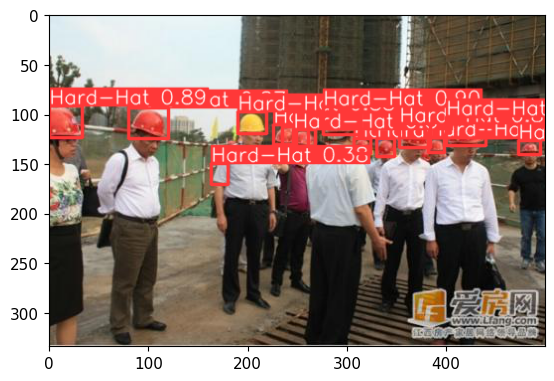

In [96]:
%matplotlib inline
plt.imshow(np.squeeze(results6.render()))
plt.show()